In [2]:
#pour que le prof puisse exécuter le code sans erreur, mettre tous les pip.install au début du notebook
#!pip install pandas fiona shapely pyproj rtree geopandas matplotlib cartiflette


In [3]:
import pandas as pd
import geopandas as gpd
import geopandas as gpd
from cartiflette import carti_download # Import corrigé
import pandas as pd
import matplotlib.pyplot as plt

In [4]:
regions = carti_download(
    values="France",
    crs=4326,
    borders="REGION",
    vectorfile_format="geojson",
    filter_by="FRANCE_ENTIERE_DROM_RAPPROCHES",
    source="EXPRESS-COG-CARTO-TERRITOIRE",
    year=2022,
)
#changer le nom du label 'LIBELLE_REGION' en 'region_nom'
regions = regions.rename(columns={'LIBELLE_REGION': 'region_nom'})

In [6]:
#récuperer la population par région de population_par_region_annee.csv
population_df = pd.read_csv(r"C:/Users\thoma\OneDrive\Documents\ENSAE\2A\Python-pour-la-data-science\Projet\python_DS_2A\data\population_par_region_annee.csv")
population_df = population_df[population_df['TIME_PERIOD'] == 2022]
population_df = population_df[['region_nom', 'population']]
population_df = population_df.reset_index(drop=True)

In [ ]:
#récuperer la population par région de population_par_region_annee.csv
creation_entreprise = pd.read_csv(r"C:/Users\thoma\OneDrive\Documents\ENSAE\2A\Python-pour-la-data-science\Projet\python_DS_2A\data\Variable explicatives\Variable_Y.csv")
creation_entreprise = creation_entreprise[creation_entreprise['TIME_PERIOD'] == 2022]
creation_entreprise = creation_entreprise[['region_nom', 'population']]
creation_entreprise = creation_entreprise.reset_index(drop=True)



FileNotFoundError: [Errno 2] No such file or directory: 'C:/Users\\thoma\\OneDrive\\Documents\\ENSAE\\2A\\Python-pour-la-data-science\\Projet\\python_DS_2A\\data\\Variable explicatives\\Variable_Y.csv'

In [7]:
# --- 1. FUSION ---
# Je fusionne avec 'population_df' (le nom de ta variable contenant les données)
gdf_final = regions.merge(population_df, on='region_nom', how='left')

# --- 2. PRÉPARATION POUR L'AFFICHAGE ---
# Création d'une colonne "texte" pour avoir des milliers séparés par des espaces dans l'infobulle
# Ex: transforme 12271794 en "12 271 794"
gdf_final['population_lisible'] = gdf_final['population'].apply(lambda x: f"{x:,.0f}".replace(",", " "))

# --- 3. CRÉATION DE LA CARTE INTERACTIVE ---
carte = gdf_final.explore(
    column='population',            # La colonne qui définit la couleur (rouge plus ou moins foncé)
    cmap='OrRd',                    # La palette de couleurs
    tooltip=['region_nom', 'population_lisible'], # Ce qui s'affiche quand la souris passe dessus !
    tiles=None,                     # IMPORTANT : Pas de fond de carte (car tes DOM-TOM sont déplacés artificiellement)
    legend=True,
    style_kwds={'weight': 0.5, 'color': 'black'}, # Fines bordures noires
    legend_kwds={'caption': "Population en 2022"}   )

# --- 4. AFFICHAGE ---
carte

4. Création de la carte...


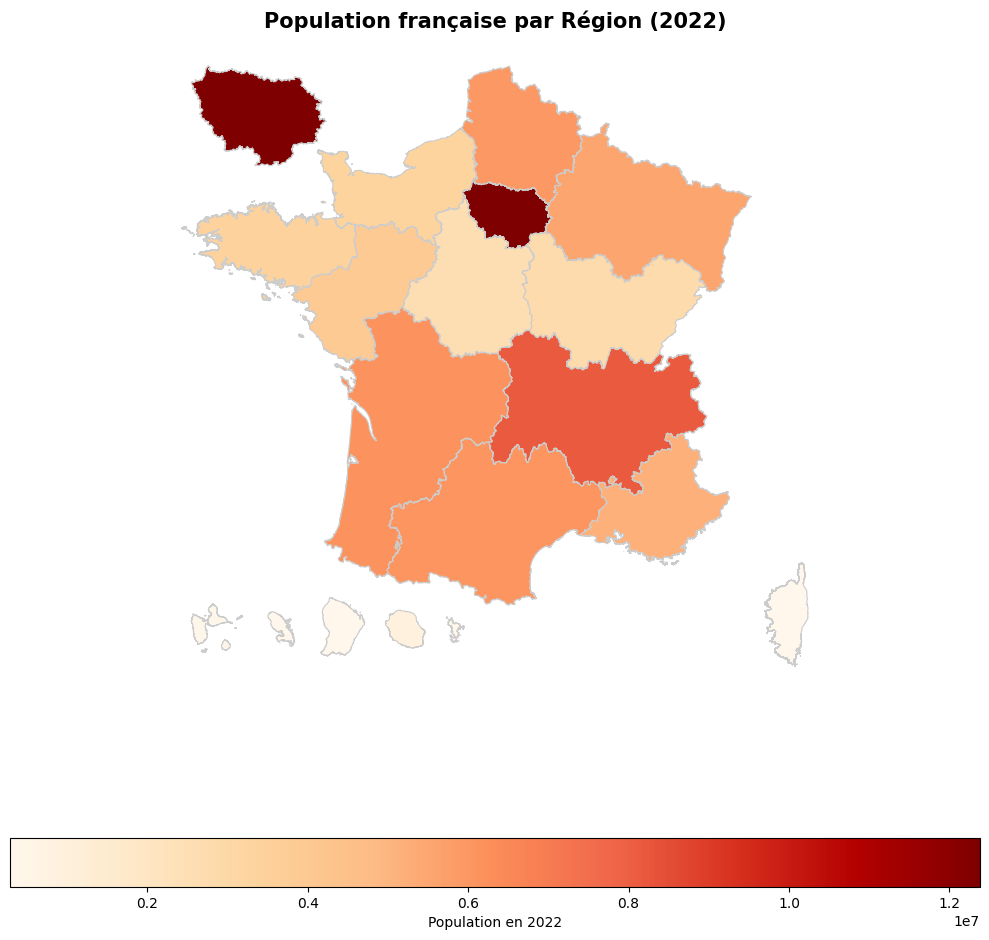

In [8]:
# 1. FUSION
# On utilise 'df_population' (ton nom de variable) et on fusionne sur la clé commune
gdf_final = regions.merge(population_df, on='region_nom', how='left')

print("4. Création de la carte...")
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# 2. AFFICHAGE
gdf_final.plot(
    column='population',      # Attention : souvent en minuscule dans ton dataframe
    cmap='OrRd',              # Palette de couleurs
    linewidth=0.8,
    edgecolor='0.8',          # Couleur des bordures des régions
    legend=True,
    legend_kwds={'label': "Population en 2022", 'orientation': "horizontal"},
    ax=ax
)

ax.set_title('Population française par Région (2022)', fontdict={'fontsize': 15, 'fontweight': 'bold'})
ax.set_axis_off()             # Supprime les axes X/Y (latitude/longitude)

plt.tight_layout()
plt.show()

In [11]:
chomage=pd.read_csv(r"C:/Users\thoma\OneDrive\Documents\ENSAE\2A\Python-pour-la-data-science\Projet\python_DS_2A\data\Variables explicatives\tx_chom.csv", sep=";")

In [13]:
#garder que les 15 premieres lignes
chomage = chomage.head(15)
#remplacer dans le nom des lignes qui contiennent 'Taux de chômage localisé par région' par rien
chomage['Taux de chômage par région'] = chomage['Taux de chômage par région'].str.replace('Taux de chômage localisé par région - ', '')